# Chapter 2: More Image Manipulation

### Implementing Color Pop Effects

In [4]:
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
from PIL import Image, ImageFont, ImageDraw, ImageFilter, ImageOps
from PIL.ImageChops import add, subtract, multiply, difference, screen, soft_light, hard_light, overlay, lighter
import PIL.ImageStat as stat
# pip install pillow_lut
from pillow_lut import load_cube_file
from skimage import color, exposure, img_as_float, data
from skimage.io import imread, imsave, imshow, show, imread_collection, imshow_collection
from skimage.transform import SimilarityTransform, PiecewiseAffineTransform, warp, swirl, rescale, resize, downscale_local_mean
from skimage.util import view_as_blocks, invert, random_noise, montage
from skimage.color import rgb2gray, gray2rgb
from skimage import measure
import scipy.ndimage as ndimage
from scipy.ndimage import affine_transform
import cv2
import wand
import blend_modes, imgviz
import numpy as np
import matplotlib.image as mpimg
import matplotlib.pylab as plt
from time import time
import os

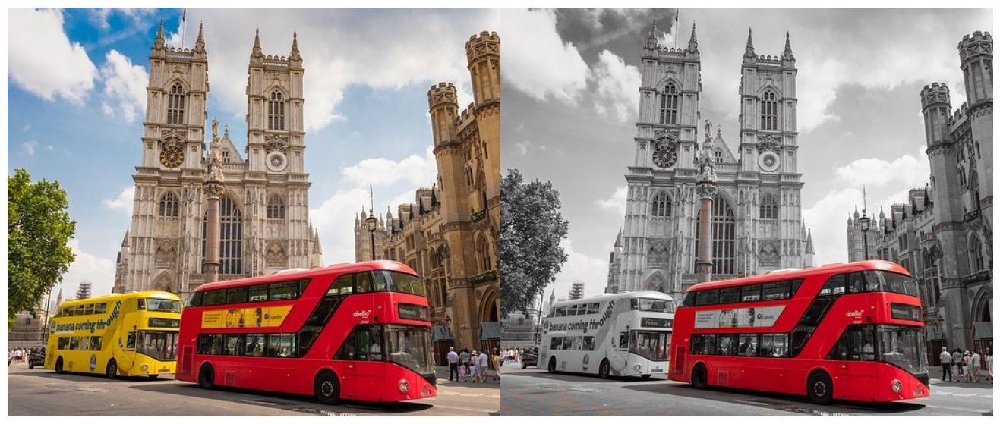

In [10]:
def apply_color_pop(im):
    gray = rgb2gray(im)
    gray = np.stack((gray,)*3, axis=-1)
    hsv = color.rgb2hsv(im)
    mask_cond = (hsv[...,0] <= 10/180) | ((hsv[...,0] >= 170/180))
    gray[mask_cond] = im[mask_cond]    
    return gray

# Load an image and apply the color pop effect
im = imread('images/bus.jpg')
im = im/im.max()
out_im = apply_color_pop(im)

plt.figure(figsize=(20,7))
plt.imshow(np.hstack((im, out_im))), plt.axis('off')
plt.show()

## Correcting a Fish-eye distorted Image

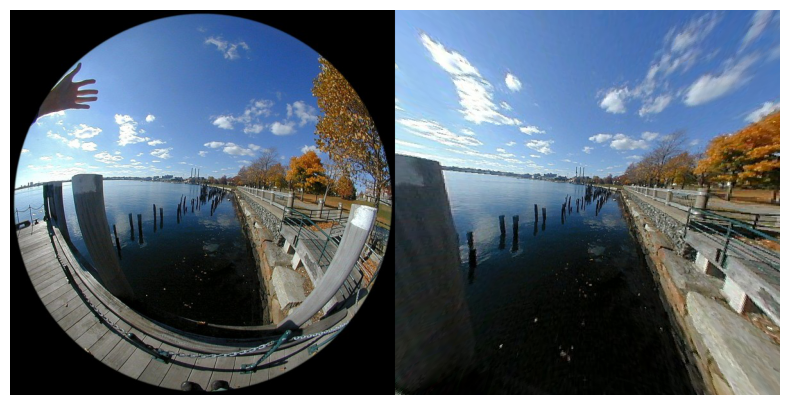

In [15]:
def undistort(im, zoom = 1):
    w, h = im.shape[:2]
    im_new = np.zeros_like(im)
    hw, hh = w / 2, h / 2
    strength = 5 #0.00001
    correction_radius = np.sqrt(w ** 2 + h ** 2) / strength
    for x in range(w):
        for y in range(h):
            new_x, new_y = x - hw, y - hh
            distance = np.sqrt(new_x**2 + new_y**2)
            r = distance / correction_radius
            theta = 1 if r == 0 else np.arctan(r) / r
            source_x, source_y = hw + theta * new_x * zoom, hh + theta * new_y * zoom
            #set color of pixel (x, y) to color of source image pixel at (source_x, source_y)
            im_new[x, y] = im[round(source_x), round(source_y)]
    return im_new
        
distorted_image = imread('images/distorted.jpg')
undistorted_image = undistort(distorted_image)
# plot the images here
plt.figure(figsize=(12,5))
plt.imshow(np.hstack((distorted_image, undistorted_image))), plt.axis('off')
plt.show()

As can be seen from the above figure, the `undistort()` function removes the fisheye distortion from the input image to a great extent.

## Image Manipulations with `scikit-image`

As done above using the library `PIL`, we can also use the `scikit-image` library functions for
image manipulation, some examples are shown below.


### Inverse warping and Geometric transformation using the `warp ()` function
`scikit-image` `transform` module's `warp()` function can be used for inverse warping for geometric
transformation of an image (discussed in a previous section), as demonstrated in the
following examples.

#### Applying translation on an image

For all possible pixels in translated output image $(x,y)$, the corresponding points in the
input image $(u, v)$ can be found with the following equations:

$$ u=x-t_x $$
$$ v=y-t_y $$

where $t_x$ and $t_y$ demotes translations along x and y axis, respectively (and $x(u,v) = x$,
$y(u,v)=y$). The following code block shows how to use the `warp()` function to translate an
image. 

In [79]:
def translate(xy, t_x, t_y):
    xy[:, 0] -= t_y
    xy[:, 1] -= t_x
    return xy

im = imread('images/monalisa.jpg')
im_trans = warp(im, translate, map_args={'t_x':50, 't_y':-100}) # create a dictionary for translation parameters

#### Applying rotation to an image

If an image is rotated by angle $\theta$ counterclockwise, for all possible pixels in rotated output image $(x,y)$, the corresponding points in the input image $(u, v)$ can be found with the following equations:

$$ u=x.cos \theta -y.sin \theta $$
$$ v=x.sin \theta +y.cos \theta $$

The following code block shows how to use the `warp()` function to rotate an image. 

In [80]:
def rotate(xy, theta):
    theta = np.pi/180*theta
    xy[:, 0], xy[:, 1] = xy[:, 0]*np.cos(theta) - xy[:,1]*np.sin(theta), xy[:, 0]*np.sin(theta) + xy[:,1]*np.cos(theta)
    return xy

im_rot = warp(im, rotate, map_args={'theta':10}) # create a dictionary for rotation parameters

In [81]:
# Centered rotation function
def rotate_centered(xy, theta, center):
    cx, cy = center
    theta = np.deg2rad(theta)
    # Translate to origin
    xy[:, 0] -= cx
    xy[:, 1] -= cy
    # Apply rotation
    x_new = xy[:, 0]*np.cos(theta) - xy[:, 1]*np.sin(theta)
    y_new = xy[:, 0]*np.sin(theta) + xy[:, 1]*np.cos(theta)
    # Translate back
    xy[:, 0], xy[:, 1] = x_new + cx, y_new + cy
    return xy

h, w = im.shape[:2]
cx, cy = w / 2, h / 2  # center coordinates
im_rot_center = warp(im, rotate_centered, map_args={'theta':10, 'center':(cx, cy)}) 

#### Applying an Affine transformation to an image

We can use the function `SimilarityTransform()` to compute the transformation matrix,
followed by `warp()` function, to carry out the transformation, as shown in the next code
block. 

In [82]:
tform = SimilarityTransform(scale=0.9, rotation=np.pi/4,translation=(im.shape[0]/2, -100))
im_sim = warp(im, tform)

### Applying the Swirl transform

This is a non-linear transform and defined by the documentation as follows.
The swirl transformation Consider the coordinate $(x,y)$ in the output image. The reverse mapping for the swirl
transformation first computes, relative to a center ($x_0,y_0$), its polar coordinates $\rho, \theta$, and then transforms them according to the following:

![](images/swirl.png)

where strength is a parameter for the amount of swirl, radius indicates the swirl extent in
pixels, and rotation adds a rotation angle. The transformation of radius into $r$ is to ensure
that the transformation decays to $≈1/1000^{th}$ within the specified radius. Here we shall use the `swirl()` function from the `skimage.transform` module.

The next figure shows the output images by applyting different tranforms using the above code snippet, the input parrot image.

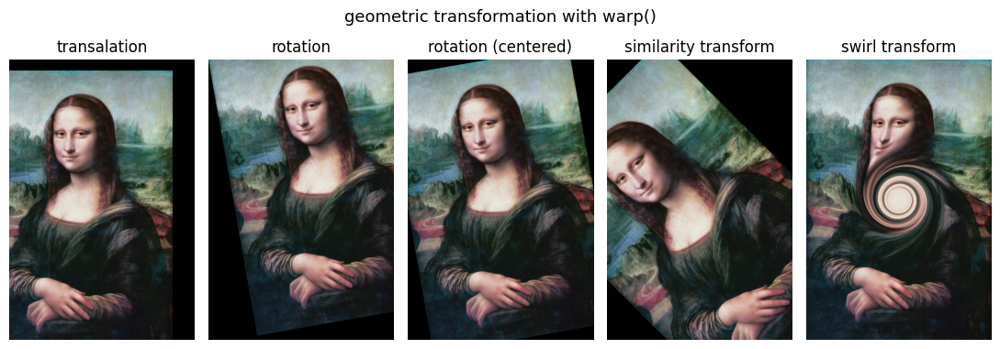

In [84]:
im_swirled = swirl(im, rotation=0, strength=60, radius=300)

plt.figure(figsize=(11,4))
plt.subplot(151), plt.imshow(im_trans), plt.axis('off'), plt.title('transalation', size=12)
plt.subplot(152), plt.imshow(im_rot), plt.axis('off'), plt.title('rotation', size=12)
plt.subplot(153), plt.imshow(im_rot_center), plt.axis('off'), plt.title('rotation (centered)', size=12)
plt.subplot(154), plt.imshow(im_sim), plt.axis('off'), plt.title('similarity transform', size=12)
plt.subplot(155), plt.imshow(im_swirled), plt.axis('off'), plt.title('swirl transform', size=12)
plt.suptitle('geometric transformation with warp()', size=13)
plt.tight_layout()
plt.show()

### Applying Piecewise Affine Transformation

A piecewise affine transformation is a type of geometric transformation that divides an image into smaller regions and applies an affine transformation independently to each region. This allows for more flexible and localized transformations compared to a global affine transformation.

In `scikit-image`, you can use the `PiecewiseAffineTransform` class to implement piecewise affine transformations. Here's a step-by-step guide on how to do it:

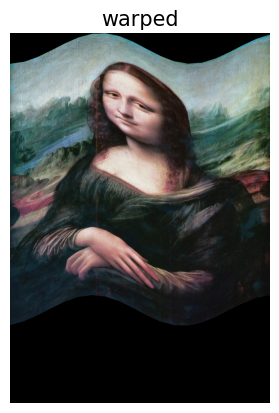

In [30]:
rows, cols = im.shape[0], im.shape[1]

src_cols = np.linspace(0, cols, 20)
src_rows = np.linspace(0, rows, 10)
src_rows, src_cols = np.meshgrid(src_rows, src_cols)
src = np.dstack([src_cols.flat, src_rows.flat])[0]

# add sinusoidal oscillation to row coordinates
dst_rows = src[:, 1] - np.cos(np.linspace(0, 3 * np.pi, src.shape[0])) * 50
dst_cols = src[:, 0]
dst_rows *= 1.5
dst_rows -= 1.5 * 50
dst = np.vstack([dst_cols, dst_rows]).T

print(src.shape, dst.shape)
# (200, 2) (200, 2)

tform = PiecewiseAffineTransform()
tform.estimate(src, dst)

out_rows = im.shape[0] - 1.5 * 50
out_cols = cols
out = warp(im, tform, output_shape=(out_rows, out_cols))

plt.imshow(out), plt.axis('off')
plt.title('warped', size=15)
plt.show()

### Adding Random Gaussian Noise to images

We can use the `random_noise()` function to add different types of noise to an image. The next
code example shows how Gaussian noise with different variances can be added to an image. The next figure shows the output image generated by adding Gaussian noises with
different variance, by running the below code snippet. As can be seen, the more the
standard deviation of the Gaussian noise, the noisier becomes the output image.

In [ ]:
im = img_as_float(imread("images/parrot.png"))
plt.figure(figsize=(12,10))
sigmas = [0.1, 0.25, 0.5, 1]
for i in range(4):
    noisy = random_noise(im, var=sigmas[i]**2)
    plt.subplot(2,2,i+1), plt.imshow(noisy), plt.axis('off')
    plt.title('Gaussian noise with sigma=' + str(sigmas[i]), size=20)
plt.tight_layout()
plt.show()

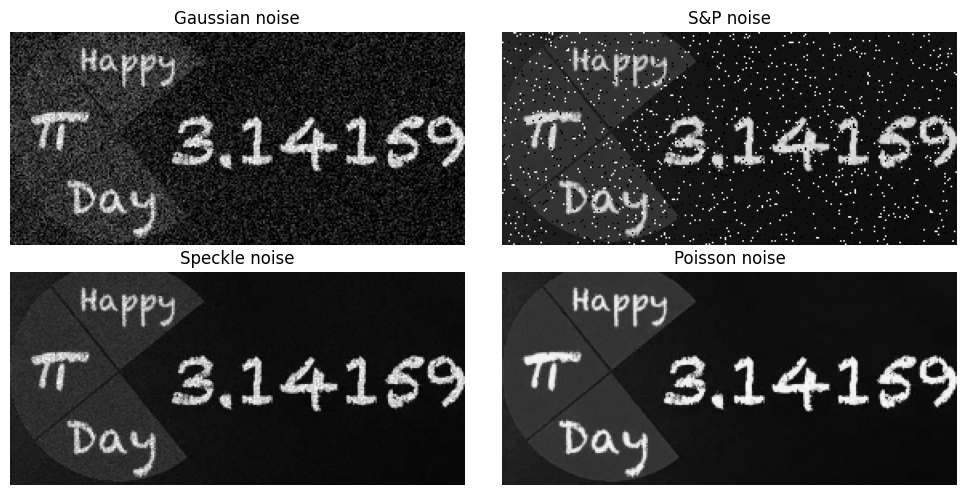

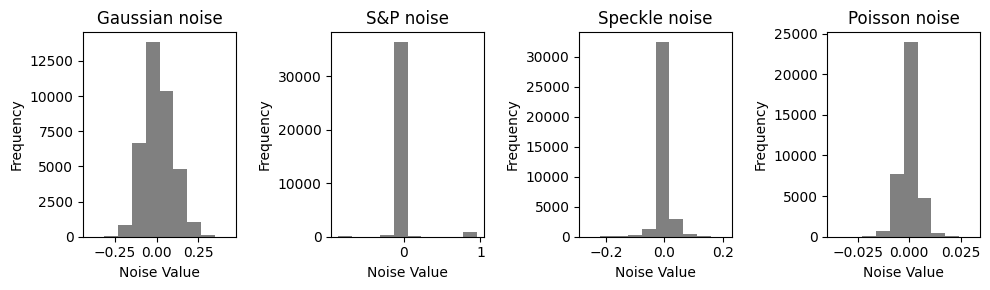

In [74]:
# Demonstrate salt & pepper and speckle noise
# Define noise types
im = imread("images/pi_day.png", True)
noise_types = ['gaussian', 's&p', 'speckle', 'poisson']
images, noise_diffs, titles = [], [], []

# Apply noise and calculate difference
for noise_type in noise_types:
    noisy = random_noise(im, mode=noise_type, seed=5)
    noise = noisy - im  # Extract noise
    images.append(noisy)
    noise_diffs.append(noise.ravel())
    titles.append(f'{noise_type.title()} noise')

# Plot noisy images
fig, axes = plt.subplots(2, 2, figsize=(10, 5))
axes = axes.ravel()
for ax, img, title in zip(axes, images, titles):
    ax.imshow(img)
    ax.set_title(title)
    ax.axis('off')
plt.tight_layout()
plt.show()

# Plot histograms of noise
fig, axes = plt.subplots(1, len(noise_diffs), figsize=(10, 3))
for ax, diff, title in zip(axes, noise_diffs, titles):
    ax.hist(diff, color='gray') # bins=10, 
    ax.set_title(title)
    ax.set_xlabel('Noise Value')
    ax.set_ylabel('Frequency')
plt.tight_layout()
plt.show()

### Creating a montage of several multi-channel images

The next code example shows how the function `montage()` can be used to create a montage
of noisy images obtained by using Gaussian noise with different variances to an image.

In [ ]:
im = img_as_float(imread("images/parrot.png"))
plt.figure(figsize=(12,12))

sigmas = np.linspace(0, 1, 25)
noisy_images = np.zeros((25, im.shape[0], im.shape[1], im.shape[2]))
for i in range(len(sigmas)):
    noisy_images[i,:,:,:] = random_noise(im, var=sigmas[i]**2)
    noisy_images_montage = montage(noisy_images, rescale_intensity=True, multichannel=True)
plt.imshow(noisy_images_montage), plt.axis('off')
plt.tight_layout()
plt.show()

### Computing the Cumulative Distribution function of an image

We can compute the cumulative distribution function (cdf) for a given image with
the `cumulative_distribution()` function, as shown below. The next figure plots the cumulative distributions for each of the R,G,B channels, as an output of the next code snippet.

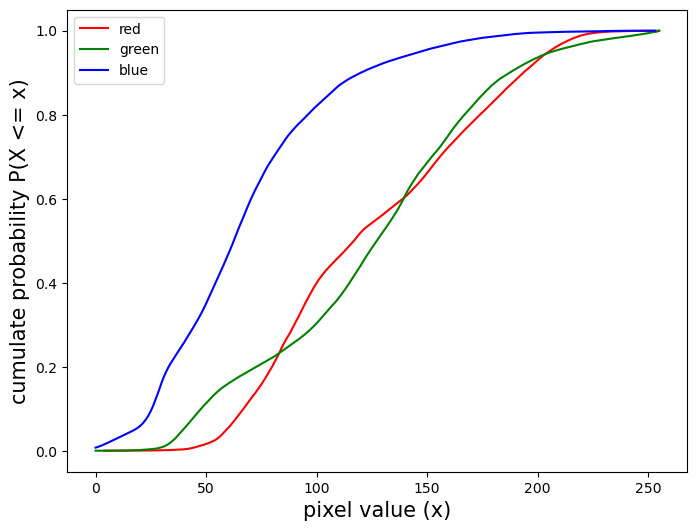

In [2]:
im = imread("images/parrot.png")
cdf_r = exposure.cumulative_distribution(im[:,:,0]) # cdf for the red channel
cdf_g = exposure.cumulative_distribution(im[:,:,1]) # cdf for the green channel
cdf_b = exposure.cumulative_distribution(im[:,:,2]) # cdf for the blue channel
plt.figure(figsize=(8,6))
plt.plot(cdf_r[1], cdf_r[0], 'r-', label='red')
plt.plot(cdf_g[1], cdf_g[0], 'g-', label='green')
plt.plot(cdf_b[1], cdf_b[0], 'b-', label='blue')
plt.xlabel('pixel value (x)', size=15)
plt.ylabel('cumulate probability P(X <= x)', size=15)
plt.legend()
plt.show()

### Resizing / rescaling an image

Original: (640, 361, 3), Rescaled: (160, 90, 3), Resized: (160, 90, 3), downscaled: (160, 121, 3)


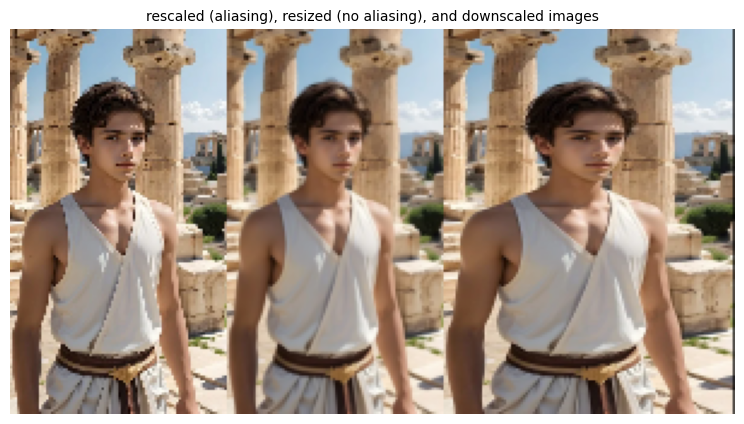

In [4]:
image = imread('images/model.png')[...,:3]
image = image / image.max()

image_rescaled = rescale(image, 0.25, anti_aliasing=False, channel_axis=-1)
image_resized = resize(image, (image.shape[0] // 4, image.shape[1] // 4), anti_aliasing=True)
image_downscaled = downscale_local_mean(image, (4, 3, 1))
print(f"Original: {image.shape}, Rescaled: {image_rescaled.shape}, Resized: {image_resized.shape}, downscaled: {image_downscaled.shape}")

plt.figure(figsize=(10,5))
plt.gray()
plt.imshow(np.hstack((image_rescaled, image_resized, image_downscaled))), plt.axis('off')
plt.title('rescaled (aliasing), resized (no aliasing), and downscaled images', size=10)
plt.show()

In [21]:
def plot_image(im, title='', fontsize=20):
     plt.imshow(im), plt.axis('off'), plt.title(title, size=fontsize)

def plot_images(images, titles, suptitle='', fontsize=20, \
                                supfontsize=22, figsize=(15,7)):
    n = len(images)
    plt.figure(figsize=figsize)
    plt.gray()
    for i in range(n):
        plt.subplot(1,n,i+1), plot_image(images[i], titles[i], fontsize)
    plt.suptitle(suptitle, size=supfontsize)
    plt.tight_layout()
    plt.show() 

(1280, 846, 3) (55, 216, 3)


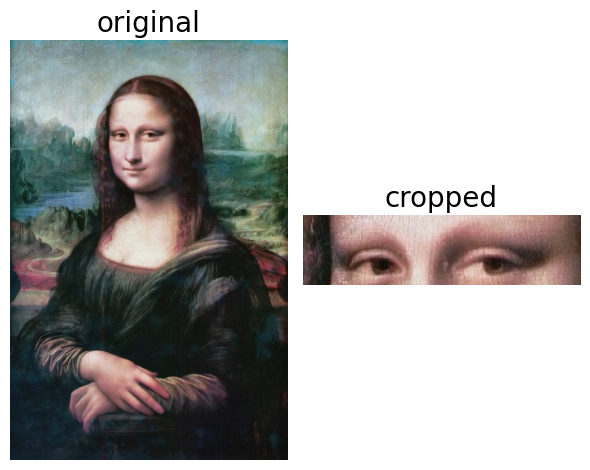

In [62]:
from skimage.util import crop 
 
im = imread('images/monalisa.jpg') 
im_cropped = crop(im, ((250, 975), (280, 350), (0,0)), copy=False) 
print(im.shape, im_cropped.shape) 
# (1280, 846, 3) (30, 171, 3) 
plot_images([im, im_cropped], ['original', 'cropped'], figsize=(6,5)) 

#### Inverting an image

We can use simply the `invert()` function to get the negative of an image, as shown in the
code below. The next figure shows the output negative image generated by running the next line of
code.

In [ ]:
im = im / im.max()
np.all(1 - im == invert(im))
Image.fromarray((255*(1-im)).astype(np.uint8))

In [ ]:
import cv2
im = cv2.cvtColor(cv2.imread('images/parrot.png'), cv2.COLOR_BGR2RGB)
plt.figure(figsize=(15,7))
plt.imshow(np.hstack((im,
            # Flip Image Vertically
            cv2.flip(im, flipCode=0),
            # Flip Image Horizontally
            cv2.flip(im, flipCode=1),
            # Flip Image Vertically and Horizontally
            cv2.flip(im, flipCode=-1))))
plt.show()

## Image Manipulations with `PIL` / `Pillow`

`PIL` provides us with many functions to manipulated an image, e.g., using a point
transformation to change the pixel values or to perform geometric transformations on an
image. Let us first start by loading the parrot png image, as shown in the following code. The next few sections describe how to do different types of image manipulations with `PIL`.

In [552]:
im = Image.open("images/parrot.png") # open the image, provide the correct path
print(im.width, im.height, im.mode, im.getbands(), im.format) # print image size, mode and format

453 340 RGB ('R', 'G', 'B') PNG


In [554]:
x = im.load()
x[0,0]

(81, 116, 94)

In [555]:
print(im.getdata()[0])
print(im.convert('L').getdata()[0])
print(im.convert('F').getdata()[0])

(81, 116, 94)
103
103.0270004272461


In [545]:
im_data = im.getdata()
print(type(im_data)) 
print(im_data.size) 
print(im.convert('L').getdata().getextrema())

<class 'ImagingCore'>
(225, 225)
(1, 235)


## Cropping an image

We can use the `crop()` function with the desired rectangle argument to extract the
corresponding area from the image, as shown in the following code.

In [16]:
im = Image.open("images/parrot.png")
im_c = im.crop((175,75,320,200)) # crop the rectangle given by (left, top, right, bottom) from the image
im_c.save("images/parrot_cropped.jpg")
im_c.show()

In [ ]:
#im_c

## Resizing an image

In order to increase or decrease the size of an image we can use the resize() function that
internally up-samples or down-samples the image, respectively.

### Resizing to a larger image

Let us start with a small clock image of size 149 x 97 and create a larger size image. The next
code snippet shows the small clock image to start from.

In [72]:
im = Image.open("images/bricks_small.jpeg")
print(im.width, im.height)
# 107 105
im.show()

150 100


In [ ]:
im = Image.open("images/bricks_small.jpeg") 
print(im.width, im.height) 
# 150 100 
im.resize((im.width*5, im.height*5), Image.BILINEAR) \
                                 .save('images/bricks_large.jpeg')  
im_large = Image.open("images/bricks_large.jpeg") 
print(im_large.width, im_large.height) 
# 750 500 
im_concat = Image.new('RGB', (2*im_large.width, im_large.height)) 
im_concat.paste(im, (0,0)) 
im_concat.paste(im_large, (im_large.width,0)) 
im_concat #.show() 

### Resizing to a smaller image

Now let us do the reverse, i.e. start with a large image of the Victoria Memorial Hall (of size
720 x 540) and create a smaller-sized image. The next code snippet shows the large image to
start from.

In [ ]:
im = Image.open("images/victoria_memorial.png") 
im.resize((im.width//5, im.height//5), Image.Resampling.LANCZOS).save('images/victoria_memorial_small.png')  
im_small = Image.open("images/victoria_memorial_small.png") 
im_concat = Image.new('RGB', (2*im.width, im.height)) 
im_concat.paste(im, (0,0)) 
im_concat.paste(im_small, (im.width,0)) 
im_concat #.show() 

### Pixelating an image

In [ ]:
def pixelate(im, factor):
    # Resize down smoothly
    im_small = im.resize((im.width//factor, im.height//factor), resample=Image.BILINEAR)
    # Scale back up using NEAREST to original size
    return im_small.resize(im.size, Image.NEAREST)

im = Image.open("images/parrot.png")
plt.figure(figsize=(15,6))
plt.imshow(np.hstack([np.array(im)] + [np.array(pixelate(im, factor)) for factor in [16,32]])), plt.axis('off')
plt.title('Pixelating by downsampling to factor of 16 and 32', size=20)
plt.show()

### Pixelating a region (face) of an image

Now, let's apply the pixelation to a part of the image, for example, the face region in the input lena image, where we want to hide the details. The pixelation effect can be applied to the refion of interest (ROI) using `numpy` slicing, as shown in the next code snippet and shown in the following figure.

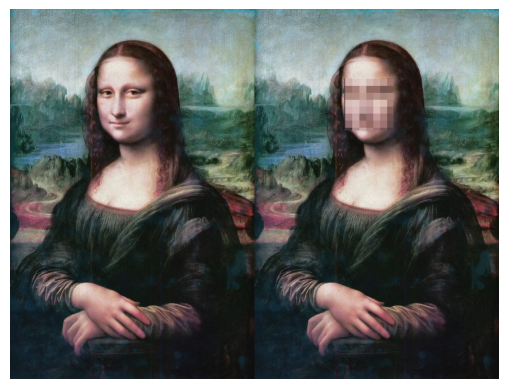

In [122]:
im = Image.open("images/monalisa.jpg")
im_p = pixelate(im, 24)
x, y, h, w = 310, 240, 180, 170 #105, 105, 55, 45  # specify rect region
out = np.array(im)
out[y:y+h, x:x+w] = np.array(im_p)[y:y+h, x:x+w]
plt.imshow(np.hstack((np.array(im), out))), plt.axis('off')
plt.show()

###  Inverting, Solarizing and Posterizing an Image

We can use the `point()` function from `PIL.Image` to transform each pixel value with a single-argument
function. We can use it to negate an image as shown in the next code block. The pixel
values are represented using 1-byte unsigned integers, that is why subtracting it from the
maximum possible value will be the exact point operation required on each pixel to get the
inverted image.

### Inverting / Negating an image

Inverting or negating an image involves reversing the colors of the pixels, turning light areas dark and vice versa. The inversion is typically performed by subtracting the pixel values from the maximum intensity value (e.g., 255). To invert a color image, each color channel is inverted independently. Let's demonstrate how the inversion operation can be implemented with the `Image.point()` function in the next code snippet.

In [125]:
im = Image.open("images/monalisa.jpg")
im_t = im.point(lambda x: 255 - x)
im_t.show()

### Solarizing / Posterizing an image

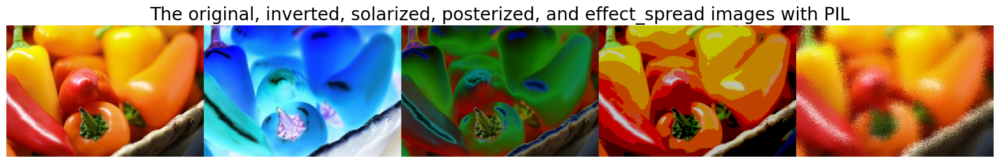

In [13]:
im = Image.open("images/pepper.webp")
im_in, im_sol, im_post = ImageOps.invert(im), ImageOps.solarize(im), ImageOps.posterize(im, 2)
im_out = Image.new('RGB', (5*im.width, im.height))
im_out.paste(im, (0,0))
im_out.paste(im_in, (im.width,0))
im_out.paste(im_sol, (2*im.width,0))
im_out.paste(im_post, (3*im.width,0))
im_out.paste(im.effect_spread(30), (4*im.width,0))
plt.figure(figsize=(20,7))
plt.imshow(im_out), plt.axis('off')
plt.title('The original, inverted, solarized, posterized, and effect_spread images with PIL', size=20)
plt.show()

### Converting an image to gray scale

We can use the `convert()` function from `PIL.Image` with parameter `'L'` to change a RGB color image to a grayscale
image as shown in the following code.

In [ ]:
im = Image.open("images/parrot.jpg")
im_g = im.convert('L') 
im_g

You can use the methods `getpixel()` / `putpixel()` too (along with the function `to_gray()`), to convert an RGB to a grasyscale image.

In [ ]:
def to_gray(r, g, b):
    return 0.2989 * r + 0.5870 * g + 0.1140 * b

w, h = im.size

for i in range(w):
    for j in range(h):
        r, g, b = im.getpixel((i, j))
        gr = int(to_gray(r, g, b))
        im.putpixel((i, j), (gr, gr, gr))
    
im

### A few gray level point transformations

### Log transformation

In [89]:
im_g.point(lambda x: 255*np.log(1+x/255)).show()

### Power-law transformation

This transformation is used as γ correction for an image. The next line of code shows how to
use the `point()` function for a power-law transformation with $γ = 0.6$.

In [91]:
im_g.point(lambda x: 255*(x/255)**0.6).show()

### Point transformation on multichannel image

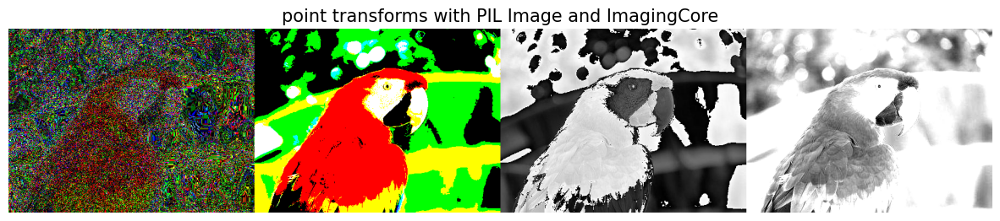

In [76]:
from PIL import Image
import numpy as np
import matplotlib.pylab as plt
im = Image.open('images/parrot.jpg')
im1 = im.point(lambda x: x*np.tan(x))
im2 = im.point(lambda x: 255 if x > 128 else 0)
im3 = im.convert('L').point(np.roll(np.arange(256), 115))
im4 = im.copy()
im4.im = im4.convert('F').getdata().point_transform(3,-100)
im4 = im4.convert('L').convert('RGB')

plt.figure(figsize=(15,7))
plt.imshow(np.hstack((im1, im2, im3.convert('RGB'), im4))), plt.axis('off')
plt.title('point transforms with PIL Image and ImagingCore', size=15)
plt.show()

### A few Geometric Transformations

Geometric image transformations involve manipulating the spatial relationships and orientation of images. These transformations can include rotation, scaling, translation, and other operations that alter the geometry of the image. Scikit-image is a Python library that provides various image processing tools, including functions for geometric transformations. The skimage.transform module in scikit-image is particularly useful for performing these operations.

Here's a brief overview of **Geometric Image Transformations**:

* **Translation**: Shifting the image along the x and y axes.
* **Rotation**: Rotating the image around a specified point.
* **Scaling**: Resizing the image by a specified factor.
* **Shearing**: Distorting the image by changing the angle of different axes.
* **Affine**: Combining translation, rotation, scaling, and shearing.
* **Projective (Homography)**: Generalized transformation for perspective changes.

In this section we shall discuss about a set of geometric transformations that are done by multiplying appropriate matrices (often expressed in homogeneous coordinates) with the image matrix. These transformations change the geometric orientation of an image, hence the name.

### Reflecting an image

We can use the `transpose()` function to reflect an image w.r.t. the horizontal or
the vertical axis. (You can use the `mirror()` function from `PIL.ImageOps` module too)

In [93]:
im.transpose(Image.FLIP_LEFT_RIGHT).show() # reflect about the vertical axis

### Rotating an image

We can use the `rotate()` function to rotate an image by an angle (in degrees).

In [94]:
im_45 = im.rotate(45) # rotate the image by 45 degrees
im_45.show() # show the rotated image

### Applying an Affine transformation on an image

In [96]:
im = Image.open("images/parrot.png")
im.transform((int(1.4*im.width), im.height), Image.AFFINE, data=(1,-0.5,0,0,1,0)).show() # shear

### Applying Perspective Transformation

In [97]:
params = [1, 0.1, 0, -0.1, 0.5, 0, -0.005, -0.001]
im1 = im.transform((im.width//3, im.height), Image.PERSPECTIVE, params, Image.BICUBIC)
im1.show()

### Changing pixel values of an image

### Adding salt and pepper noise to an image

In [99]:
# choose 5000 random locations inside image
im1 = im.copy() # keep the original image, create a copy
n = 5000
x, y = np.random.randint(0, im.width, n), np.random.randint(0, im.height, n)
for (x,y) in zip(x,y):
    im1.putpixel((x, y), ((0,0,0) if np.random.rand() < 0.5 else (255,255,255))) # salt-and-pepper noise
im1.show()

### Drawing on an image

We can draw lines or other geometric shapes on an image (e.g., the `ellipse()` function to draw
an ellipse) from the `PIL.ImageDraw module`, as shown in the next python code fragment.

In [7]:
im = Image.open("images/parrot.png")
draw = ImageDraw.Draw(im)
draw.ellipse((125, 125, 200, 250), fill=(255,255,255,128))
del draw
im.show()

### Drawing Bonding Boxes

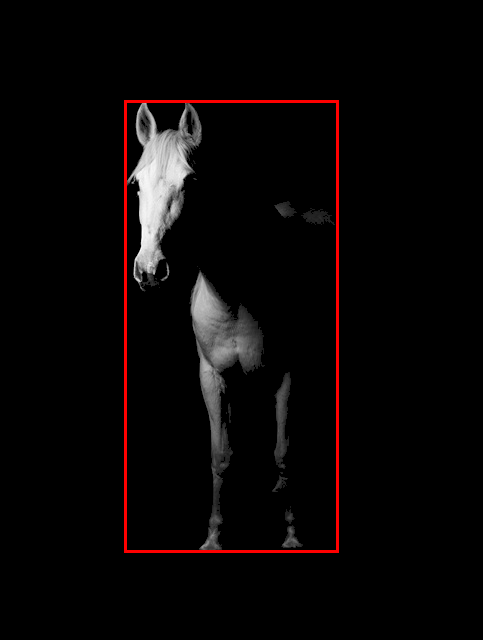

In [127]:
from PIL import ImageDraw
im = Image.open('images/horse.png').convert('L')
im = im.convert('RGB')
draw = ImageDraw.Draw(im)
draw.rectangle(im.getbbox(), fill = None, outline ="red", width = 3) 
del draw
im

### Drawing text on an image

We can draw texts on an image using the `text()` function from `PIL.ImageDraw module`, as
shown in the next python code fragment.

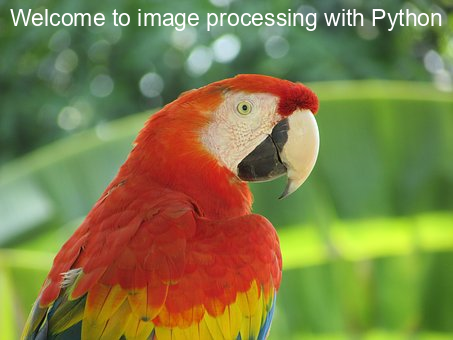

In [8]:
im = Image.open("images/parrot.png")
draw = ImageDraw.Draw(im)
font = ImageFont.truetype("arial.ttf", 23) # use a truetype font
draw.text((10, 5), "Welcome to image processing with Python", font=font)
del draw
im

### Pasting an image on top of another

We can use the `paste()` function to paste an image on top of another, as shown below. The following figure shows the output image generated by running the code snippet.

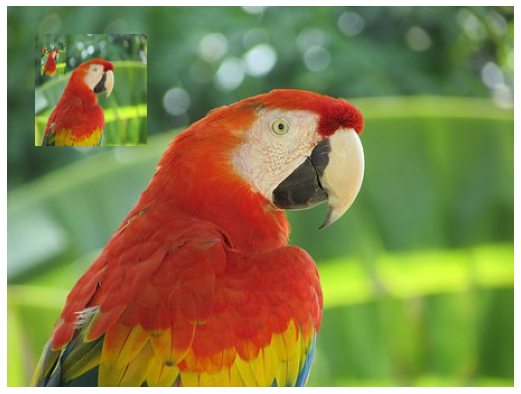

In [107]:
im = Image.open("images/parrot.png")
for i in range(5):
    im_small = im.resize((100,100))
    im.paste(im_small, (25,25))
plt.figure(figsize=(10,7))
plt.imshow(im), plt.axis('off')
plt.show()

### Creating a Thumbnail

We can create the same image as in the last example but this time creating a thumbnail
from the image with the `thumbnail()` function, as shown in the next code block.

In [109]:
im = Image.open("images/parrot.png")
im_thumbnail = im.copy() # need to copy the image first
im_thumbnail.thumbnail((100,100))
im.paste(im_thumbnail, (10,10))
im.show()

### Computing the basic statistics of an image

We can use the stat module to compute the basic statistics (mean, median, standard
deviation of pixel values of different channels etc.) of an image, as shown in the next code
block.

In [111]:
s = stat.Stat(im)
print(s.extrema) # maximum and minumum pixel values for each channel R, G, B
print(s.count)
print(s.mean)
print(s.median)
print(s.stddev)

[(4, 255), (0, 255), (0, 253)]
[154020, 154020, 154020]
[127.62241916634203, 124.89540319439034, 67.81682249058564]
[121, 130, 62]
[47.486354000919064, 52.13537728737721, 39.689444601928486]


### Plotting the histograms of pixel values for the RGB channels of an image

The function `histogram()` can be used to compute the histogram (a table of pixel values vs.
frequencies) of pixels for each channel and returns the concatenated output (e.g., for an
RGB image, the output contains 3 x 256 =768 values). The following figure shows the R,G,B color histograms plotted by running the code snippet.

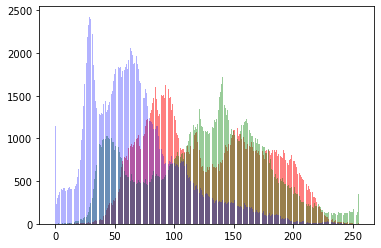

In [112]:
pl = im.histogram()
plt.bar(range(256), pl[:256], color='r', alpha=0.5)
plt.bar(range(256), pl[256:2*256], color='g', alpha=0.4)
plt.bar(range(256), pl[2*256:], color='b', alpha=0.3)
plt.show()

### Separating the RGB channels of an image

We can use the `split()` function to separate the channels of a multi-channel image, as is
shown in the following code for an RGB image.

In [ ]:
ch_r, ch_g, ch_b = im.split() # split the RGB image into 3 channels: R, G and B
# we shall use matplotlib to display the channels
plt.figure(figsize=(18,6))
plt.subplot(1,3,1); plt.imshow(ch_r, cmap=plt.cm.Reds); plt.axis('off')
plt.subplot(1,3,2); plt.imshow(ch_g, cmap=plt.cm.Greens); plt.axis('off')
plt.subplot(1,3,3); plt.imshow(ch_b, cmap=plt.cm.Blues); plt.axis('off')
plt.tight_layout()
plt.show() # show the R, G, B channels

### Combining multiple channels of an image

We can use the `merge()` function to combine the channels of a multi-channel image, as is shown in the
following code, where the color channels obtained by splitting the parrot RGB image is merged after swapping
the red and blue channels.

In [116]:
im = Image.merge('RGB', (ch_b, ch_g, ch_r)) # swap the red and blue channels obtained last time with split()
im.show()

### The alpha (α) channel and blending image

### Convert a jpg image to a transparent png image

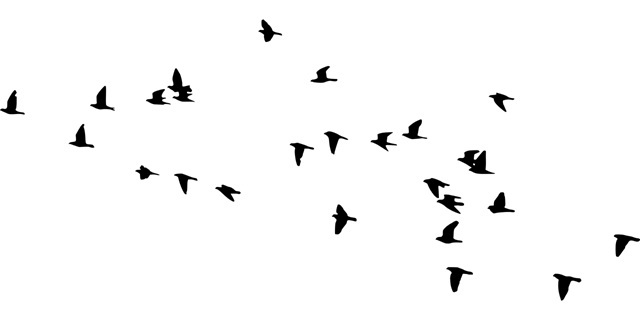

In [139]:
import numpy as np
from PIL import Image, ImageChops

img_trans = Image.new('RGBA', img.size)
alpha = Image.open('images/birds.jpg').convert('L')
img_trans.putalpha(ImageChops.invert(alpha))
img_trans.save('images/bird.png')
img_trans

In [49]:
import numpy as np
from PIL import Image

img = Image.open('images/parrot.jpg') # n x m x 3
imga = img.convert("RGBA")  # n x m x 4

imga = np.asarray(imga) 
r, g, b, a = np.rollaxis(imga, axis=-1) # split into 4 n x m arrays 
r_m = r > 100 # binary mask for red channel, True for read feathers
g_m = g < 100 # binary mask for green channel, True for read feathers
b_m = b < 200 # binary mask for blue channel, True for read feathers

# combine the three masks using the binary "or" operation 
# multiply the combined binary mask with the alpha channel
a = a * ((r_m == 1) & (g_m == 1) & (b_m == 1))

# stack the img back together 
imga =  Image.fromarray(np.dstack([r, g, b, a]), 'RGBA')
imga.save('images/parrot_transparent.png')

print(img.mode, imga.mode)

RGB RGBA


![](images/parrot_transparent.png)

### α-blending two images

The function `PIL.Image.blend()` can be used to create a new image by interpolating between two given
images (of same size), using a constant α. Both images must have the same size and mode.
The output image is given by $out = image_1. (1.0 - α) + image_2. α$
If α is 0.0, a copy of the first image is returned. If α is 1.0, a copy of the second image is
returned. The next code snippet shows an example.

In [120]:
im1 = Image.open("images/parrot.png")
im2 = Image.open("images/hill.png")
# 453 340 1280 960 RGB RGBA
#im1 = im1.convert('RGBA') # if two images have different modes, must be converted to the same mode
im2 = im2.resize((im1.width, im1.height), Image.BILINEAR) # two images have diffrent sizes, must be converted to the same size
im = Image.blend(im1, im2, alpha=0.5).show()

### α-compositing two images

The method `Image.alpha_composite(a,b)` creates a composite image $a$ over $b$. The equation for alpha value and pixel value of the generated images are:

![](images/alpha_composite.png)

where $\alpha_a$, $\alpha_b$ represent the transparency values and $v_a$, $v_b$ represent the pixel values of the images $a$ and $b$ (RGBA images), respectively. The next code snippet uses this function to obtain a composite of two images, it converts the input RGB images to RGBA image with the method `Image.putalpha()`.

In [ ]:
fish = Image.open('images/fish.png')
sea = Image.open('images/sea.png')
fish.putalpha(100)
sea.putalpha(200)
alpha_comp = Image.alpha_composite(sea, fish)
plt.figure(figsize=(15,5))
plt.imshow(np.hstack((np.array(fish), np.array(sea), np.array(alpha_comp)))), plt.axis('off')
plt.title('alpha composite of the fish and sea images', size=20)
plt.show()

### Adding watermark to an image

In [ ]:
from PIL import Image

cover_image = Image.open('images/parrot.jpg').convert('RGBA')
watermark = Image.open('images/packt.png').resize((100,50)).convert('RGBA')

layer = Image.new('RGBA', cover_image.size, (0, 0, 0, 0))
layer.paste(watermark, (325, 225))

# Create a copy of the layer
layer2 = layer.copy()
# Put alpha on the copy
layer2.putalpha(128)
# merge layers with mask
layer.paste(layer2, layer)

watermarked_image = Image.alpha_composite(cover_image, layer)
watermarked_image.convert('RGB')

### Blending two images with a mask

In [ ]:
from PIL import Image, ImageOps

# Load an image and invert
im = Image.open('images/butterfly.png')
w, h = im.size
im_inv = ImageOps.invert(im)

# Create an intensity gradient mask
grad_mask = np.linspace(0, 1, w)
grad_mask = Image.fromarray((255*np.tile(grad_mask, (h, 1))).astype(np.uint8))

# Composite the image with its inverted version using the gradient mask
im_out = Image.composite(im, im_inv, grad_mask)
print(im.mode, im_inv.mode, grad_mask.mode, im_out.mode)

plt.figure(figsize=(18,12))
plt.gray()
plt.subplot(221), plt.imshow(im), plt.title('original', size=20), plt.axis('off')
plt.subplot(222), plt.imshow(im_inv), plt.title('inverted', size=20), plt.axis('off')
plt.subplot(223), plt.imshow(grad_mask), plt.title('intensity gradient mask', size=20), plt.axis('off')
plt.subplot(224), plt.imshow(im_out), plt.title('composite image', size=20), plt.axis('off')
plt.tight_layout()
plt.show()

Now, use just `numpy` arrays (don't use `PIL` methods) to compute a composite image, this is left as an exercise to the reader (should not need more than three lines of code).

### Adding and differencing two images

The next code snippet shows how an image can be generated by adding two input images (of same size) pixel by pixel using the function `PIL.ImageChops.add()`.

In [126]:
im1 = Image.open("images/parrot.png")
im2 = Image.open("images/hill.png").convert('RGB').resize((im1.width,im1.height))
add(im1, im2).show()

The next line of code uses the function `PIL.ImageChops.difference()` to obtain the absolute value of the pixel-by-pixel difference between the images.

In [128]:
difference(im1, im2).show()

In [ ]:
def diff_numpy(im1, im2): # assumes images have dtype np.uint8, pixel values in between [0,255]
    return np.clip(np.abs(color.rgb2gray(np.array(im1)) - color.rgb2gray(np.array(im2))), 0, 255)

def brighten(im):
    return np.clip((255*im/im.max()).astype(np.uint8) + 50, 0, 255)

im1 = Image.open("images/goal1.png")
im2 = Image.open("images/goal2.png")
#im = screen(im1, im2)
im = difference(im1, im2)
im.save("images/goal_diff.png")

plt.figure(figsize=(15,9))
plt.subplot(221), plt.imshow(im1), plt.axis('off'), plt.title('frame 1', size=20)
plt.subplot(222), plt.imshow(im2), plt.axis('off'), plt.title('frame 2', size=20)
plt.subplot(223), plt.imshow(im), plt.axis('off'), plt.title('difference (PIL)', size=20)
plt.subplot(224), plt.imshow(brighten(diff_numpy(im1, im2)), cmap='gray'), plt.axis('off'), plt.title('difference (numpy)', size=20)
plt.tight_layout()
plt.show()

### Subtracting two images

In [ ]:
im1 = Image.open("images/parrot.png").convert('RGB')
im2 = Image.open("images/hill.png").convert('RGB')
im = subtract(im1, im2, scale=1.0, offset=0)
print(im1.size, im2.size, im.size)
im.save("images/parrot_hill_subtract.jpg")
#im.show()
plt.figure(figsize=(12,5))
plt.imshow(np.hstack((im, np.array(difference(im, im1))))), plt.axis('off')
plt.title('subtract images and take difference of the output from the first image', size=15)
plt.show()

### Superimposing two images with soft_light, hard_light, overlay algorithms

### with `PIL`

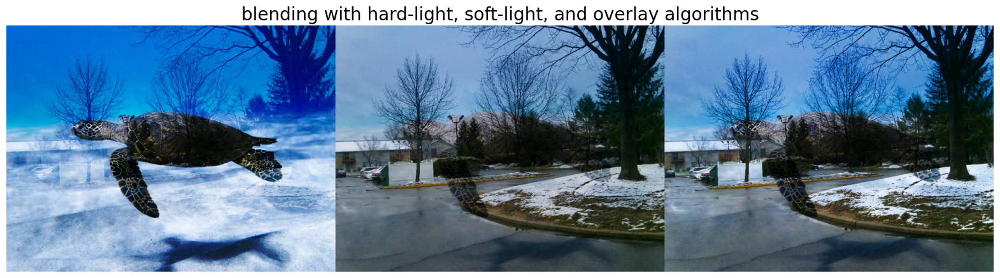

In [5]:
im1 = Image.open("images/scene.jpg")
im2 = Image.open("images/turtle.jpeg").convert('RGB').resize((im1.width, im1.height))
im_hard = hard_light(im1, im2)
im_soft = soft_light(im1, im2)
im_overlay = overlay(im1, im2)
plt.figure(figsize=(20,7))
plt.imshow(np.hstack((im_hard, im_soft, im_overlay))), plt.axis('off')
plt.title('blending with hard-light, soft-light, and overlay algorithms', size=20)
plt.show()

### with `blend-modes`

In [ ]:
#opacity = 0.7  # The opacity of the foreground that is blended onto the background is 70 %.
plt.figure(figsize=(15,5))
i = 1
for opacity in [0.3, 0.5, 0.8]:
    blended_img_float = blend_modes.soft_light(imgviz.rgb2rgba(np.array(im1)).astype(float), 
                               imgviz.rgb2rgba(np.array(im2)).astype(float), opacity)
    plt.subplot(1,3,i), plt.imshow(np.uint8(blended_img_float)), plt.axis('off'), plt.title(f'opacity={opacity}', size=20)
    i += 1
plt.suptitle('Blending with soft-light algorithm with blend_modes', size=22)
plt.tight_layout()
plt.show()

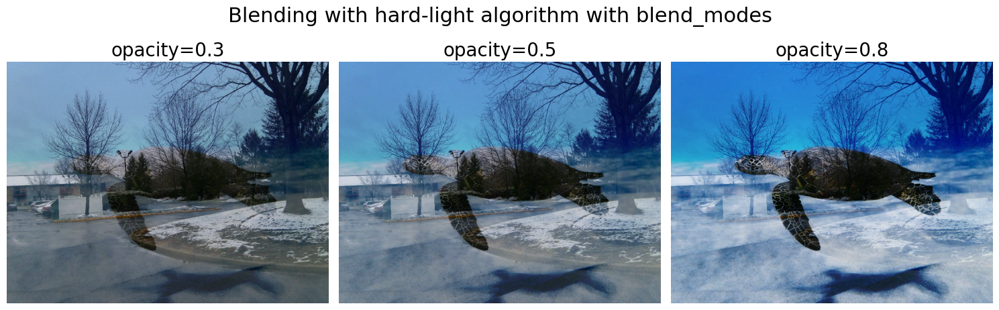

In [12]:
#opacity = 0.7  # The opacity of the foreground that is blended onto the background is 70 %.
plt.figure(figsize=(15,5))
i = 1
for opacity in [0.3, 0.5, 0.8]:
    blended_img_float = blend_modes.hard_light(imgviz.rgb2rgba(np.array(im1)).astype(float), 
                               imgviz.rgb2rgba(np.array(im2)).astype(float), opacity)
    plt.subplot(1,3,i), plt.imshow(np.uint8(blended_img_float)), plt.axis('off'), plt.title(f'opacity={opacity}', size=20)
    i += 1
plt.suptitle('Blending with hard-light algorithm with blend_modes', size=22)
plt.tight_layout()
plt.show()

In [132]:
im1 = Image.open("images/parrot.png")
im2 = Image.open("images/hill.png").convert('RGB').resize((im1.width, im1.height))
screen(im1, im2).show()

### Getting darker / lighter of two images

Compares the two images, pixel by pixel, and returns a new image containing the lighter values, using the function `PIL.ImageChops.lighter()`.

In [194]:
im1 = Image.open("images/parrot.png")
im2 = Image.open("images/hill.png").convert('RGB').resize((im1.width, im1.height))
lighter(im1, im2).show()

## Questions

### Question 1: Applying Barrel Distortion / Undistortion with `scikit-image`

**Barrel distortion** is a type of lens distortion where straight lines bulge outward from the center of the image—like the shape of a barrel. This typically occurs with wide-angle lenses. Mathematically, it's a radial distortion:

- The further a pixel is from the image center, the more it gets pushed outward.
- The distortion increases with the square of the distance from the center.

Control points are pairs of corresponding pixel coordinates between:

- The distorted image (after barrel distortion is applied), and
- The original/ideal undistorted image.

Think of them as landmarks: points where we know exactly how the distortion moved them. These are used to "reverse" the distortion.
The distortion model: $$\vec{𝑥}_{distorted}=\vec{𝑥} + k.r^2.\left(\vec{𝑥}−\vec{𝑥}_{center}\right)$$

The more control points you use, the more accurate the transformation — at the cost of computation. You can tweak $k$ to simulate different levels of barrel distortion.

First define a custom python function `barrel_mapping()` that applies barrel distortion to an image by using `skimage.transform.warp()`, the function will radially push each pixel outward from the image center based on its distance, scaled by the distortion coefficient $k$, using the above equation.

The `barrel_mapping` function creates a radial distortion map. The image is warped forward using that map. The output is a realistically distorted image as shown above, now try to undistort using **TPS**.

#### Undistortion with Thin Plate Splines (TPS)

**TPS** is a smooth, non-linear interpolation method. It's excellent for warping images based on a set of corresponding control points.

TPS finds a smooth function $f(x, y)$ such that:

$$f(x,y)=a_1+a_2x+a_3y+ \sum\limits_{i=1}^{N} w_i U(\|(x,y)−(x_i,y_i)\|)$$
where $U(r)=r^2 log(r)$ is the radial basis function, $(x_i,y_i)$ are control points (source/target) and $w_i$ are weights.

Now, use TPS to **undo** the barrel distortion: Simulate barrel distortion to get distorted control points. Use TPS to map distorted to original (undistorted) points.

**Hint**: Uses the function `ThinPlateSplineTransform()` and `warp()` from `skimage.transform` module to correct barrel distortion in an image. Create a grid of control points using `np.meshgrid()` and simulates barrel distortion by displacing each point radially based on distance from the center using `np.linalg.norm()`. Pass the distorted and original control points  to `skimage.transform.estimate()`, which fits a **Thin Plate Spline** (**TPS**)  model that maps the input distorted image back to an undistorted image.

### Question 2: Applying Gaussian Blur with `scikit-image` vs. `opencv-python`

In this exercise, you will analyze the similarities and differences between the implementations of Gaussian blur (used for smoothing an image) from `opencv-python` (`cv2.GaussianBlur`) and `scikit-image` (`skimage.filters.gaussian`). Carefully examine the code below, which applies Gaussian blur using both libraries with matching parameters.

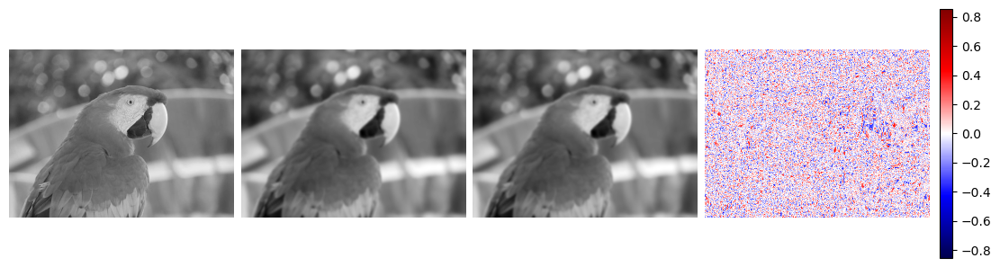

In [34]:
# The code is taken from here: https://stackoverflow.com/questions/36263738/why-is-gaussian-filter-different-between-cv2-and-skimage

import cv2
from skimage.filters import gaussian
import matplotlib.pyplot as plt

img = cv2.imread('images/parrot.png', cv2.IMREAD_GRAYSCALE)

truncate = 4
sigma = 2
radius = int(truncate * sigma + 0.5)
ksize = 2 * radius + 1

blur_opencv = cv2.GaussianBlur(img, (ksize, ksize), sigma, borderType=cv2.BORDER_REFLECT)
blur_scipy = gaussian(img, sigma, truncate=truncate, preserve_range=True, mode='reflect')

fig, axs = plt.subplots(ncols=4, layout='constrained', figsize=(11, 3))
axs[0].imshow(img, cmap='gray')
axs[1].imshow(blur_opencv, cmap='gray')
axs[2].imshow(blur_scipy, cmap='gray')
diff = blur_opencv - blur_scipy
diff = axs[3].imshow(diff, cmap='seismic', vmin=diff.min(), vmax=-diff.min())
fig.colorbar(diff, shrink=.95)
for ax in axs:
    ax.set_axis_off()

Now, explain the functional difference between `cv2.GaussianBlur` and `skimage.filters.gaussian`. Include in your answer:

- Which library modifies the image in-place (if any)?

- How the image data type and range are handled by default in each function.

- Discuss how the following parameters affect the blur output in both implementations:
    - `sigma`
    - `truncate`
    - `ksize` (`opencv-python` only)

- Interpret the difference image (subplot 4): What does it reveal about the precision or behavior of the two implementations?
- Compare the default assumptions and behaviors, including:
    - Kernel generation and size determination
    - Border handling (`borderType` in `opencv-python` vs `mode` in `skimage`)
    - Normalization and data range (`preserve_range` in `skimage`)

- What would happen if truncate is changed to a smaller or larger value? Describe the visual and numerical effects on the resulting blur.

- Modify the code to blur a color image instead of grayscale. Which implementation handles multichannel images better or more intuitively? Justify your answer based on the documentation or your results.


### Question 3: Apply Selective Blurring with `scipy.ndimage`

Use the function `scipy.ndimage.gaussian_filter()` to blur the face of the monalisa color image. Create an appropriate binary mask and apply selective filtering. You should obtauin a figure like the next one.

![](images/mona_face_blurred.png)

### Question 4: Rendering Bangla Text on an Image using Pillow

Write a Python script that overlays a line of Bangla text (e.g., a song lyric or a phrase) onto an image using the `Pillow` library. This task involves loading an image, choosing an appropriate font that supports Bangla characters, and drawing the text properly aligned and styled. Here are the steps you need to follow:

- Download or use any existing image (e.g., a concert photo or stage background).
- Choose a Bangla phrase such as as phrase from a Tagore-song-lyric ("তোমার খোলা হাওয়া") and render it at the bottom of the image using a yellow font.
- Ensure that the text appears centered horizontally and is placed just above the bottom edge of the image.
- Save the modified image as a new file.

**Requirements**:

- Use the `ImageDraw` and `ImageFont` modules from the Pillow library.
- Use a **Bangla Unicode-compatible** `.ttf` font like *NotoSansBengali-Regular.ttf*. (Make sure this font file is in the same directory as your script or provide the full path.)
- Use a font size that fits the text cleanly within the image boundaries.

**Notes**:
- Bangla Joint Characters Issue: Many Bangla words contain ligatures or "যুক্তাক্ষর" (joint letters). These may not render correctly if:
  - You use an inappropriate or non-Unicode font.
  - Your system lacks full rendering support (e.g., Raqm).
- To ensure correct rendering of joint characters, you must use a font that supports the full Bangla script, such as Google's Noto Sans Bengali.
- If joint characters still appear disconnected or broken:
  - Consider enabling `libraqm` support in `Pillow` (`PIL`).
  - Alternatively, simplify your text or choose a phrase without joint letters for demonstration purposes.

You should obtain an output figure as shown below:

![](images/singer_live_overlayed_bangla_text.png)

### Question 5: Interactive Video Speed Transformer

Let us build a Gradio-based interface that allows users to upload a video and view both slow-motion and fast-forward versions of the video side-by-side. You will develope a Python application that enables interactive video speed manipulation using OpenCV and Gradio. The application should allow a user to:

   - Upload an `.mp4` video file.
   - Adjust slow-motion and fast-forward factors using sliders.
   - Display the original, slow-motion, and fast-forward videos in a clean side-by-side layout using Gradio Blocks.

Here the are steps:

- Use functions from `opencv-python` to:

    - Read the uploaded video.
    - Modify the playback speed:
      - For slow-motion: duplicate frames and reduce FPS.
      - For fast-forward: skip frames and increase FPS.
      - Write each new video to a temporary .mp4 file.

- Use `gradio` to:

    - Organize the controls (file upload and sliders) on the top row.
    - Display the three videos (original, slow-motion, fast-forward) side-by-side in the bottom row.
    - Use an action button labeled "Generate" to apply the speed transformations.

Ensure the following:

   - Each video uses valid MP4 encoding (mp4v codec).
   - Temporary files are used for saving transformed videos.
   - The app works reliably with typical short .mp4 videos.

Display a warning if the uploaded file format is not supported. Add loading indicators or status messages using Gradio components to improve user experience. 

Expected Output: A running Gradio interface that lets users explore how playback speed affects video perception, with a responsive layout and working controls.

**Hints**:

-  Use `cv2.VideoCapture()` and `cv2.VideoWriter()` to read/write frames.
- Use `tempfile.mktemp()` to manage temporary video paths.
- Wrap layout with `gr.Blocks()` and use `gr.Row()` for structuring the UI.
- See `gradio`’s Video component for input/output configuration.

This exercise reinforces your understanding of real-time video manipulation, frame-rate control, and creating interactive web apps with Gradio—an essential combination for building modern multimedia tools. The interface should look like the following:

<img src="images/humming.gif" width="640" align="center">